#### Monet Image Investigation

In [5]:
import matplotlib.pyplot as plt
from PIL import Image

def compare_single_pair(real_path, fake_path, figsize=(12, 6)):
    """ Display one pair of real and fake images side-by-side """
    
    fig, axes = plt.subplots(1, 2, figsize=figsize)
    
    # Load images
    real_img = Image.open(real_path)
    fake_img = Image.open(fake_path)
    
    # Display images
    axes[0].imshow(real_img)
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    axes[1].imshow(fake_img)
    axes[1].set_title('Generated')
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

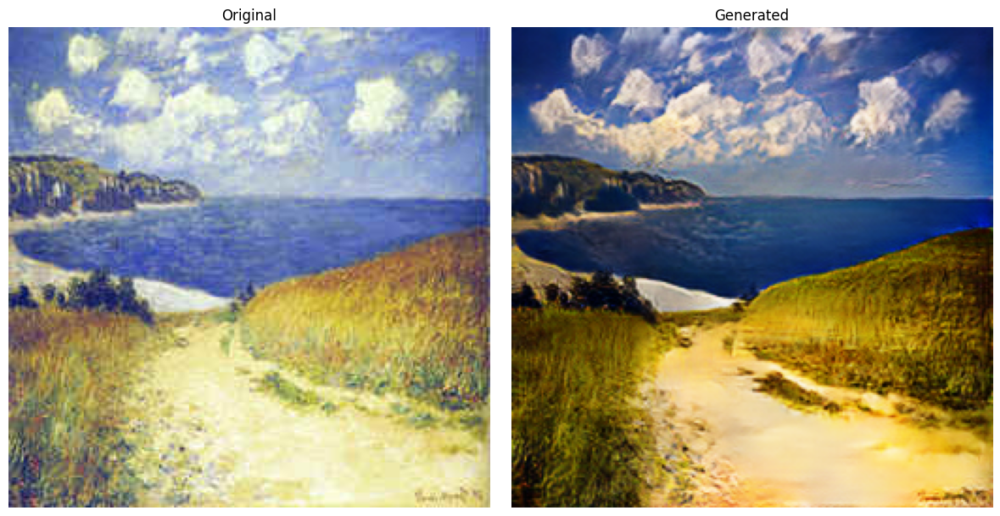

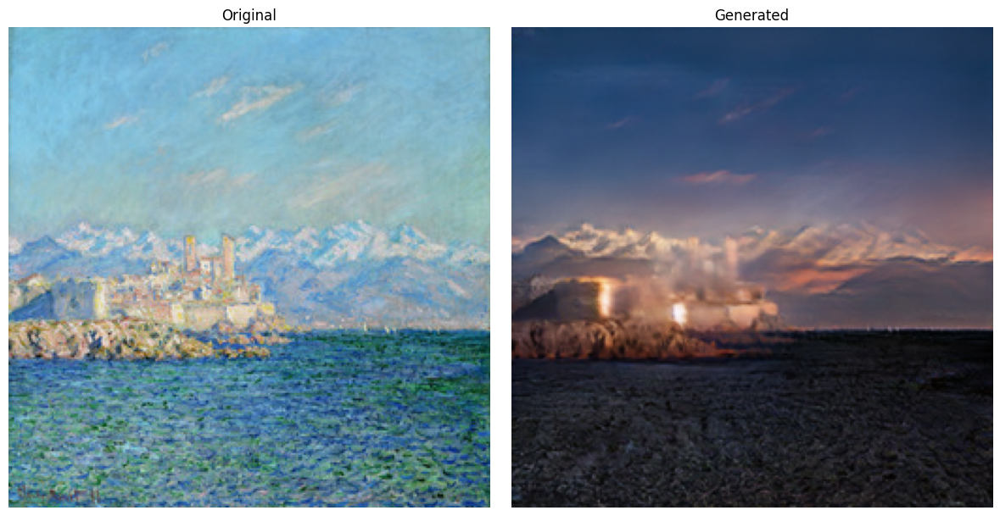

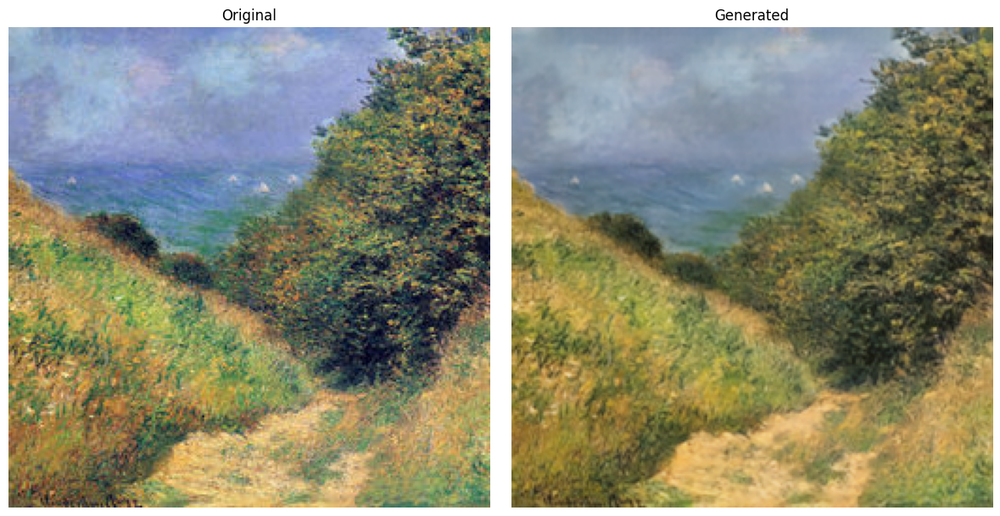

In [10]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00010_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00010_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00020_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00020_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00460_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00460_fake.png")

#### FID Calculation for Monet Images

#### Cezanne & Monet Comparison

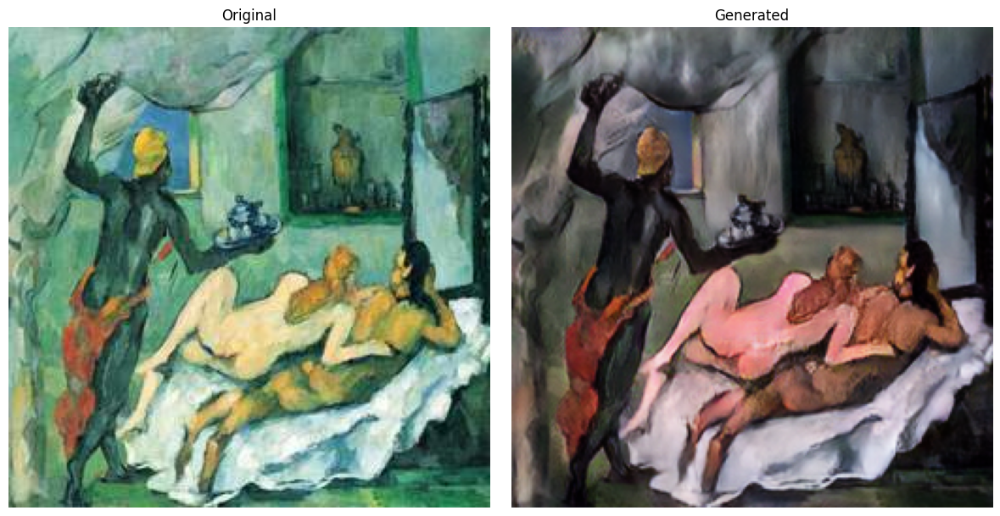

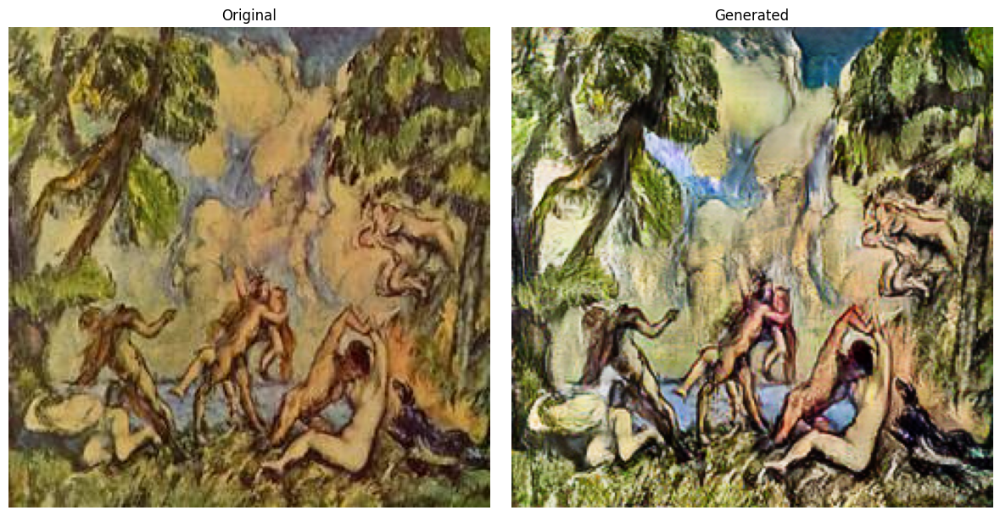

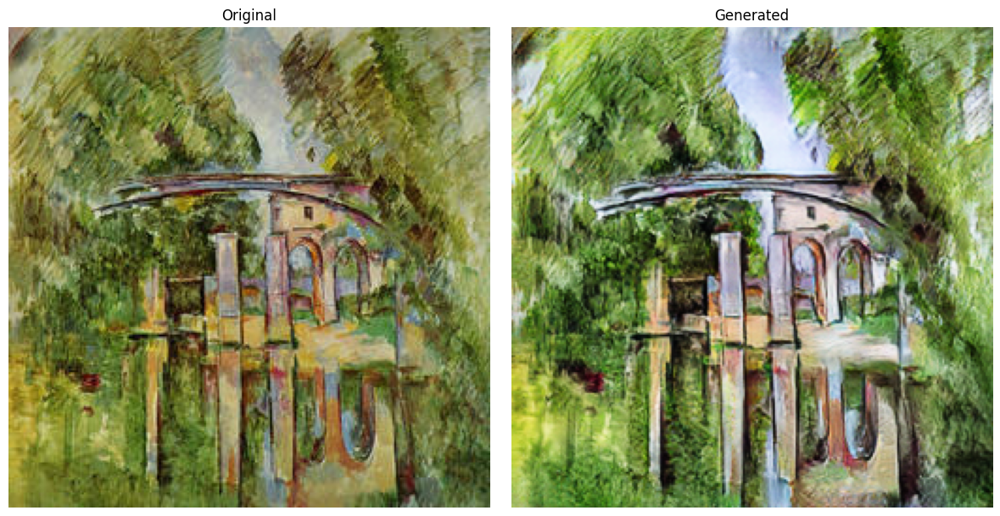

In [9]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00010_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00010_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00020_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00020_fake.png")

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_fake.png")

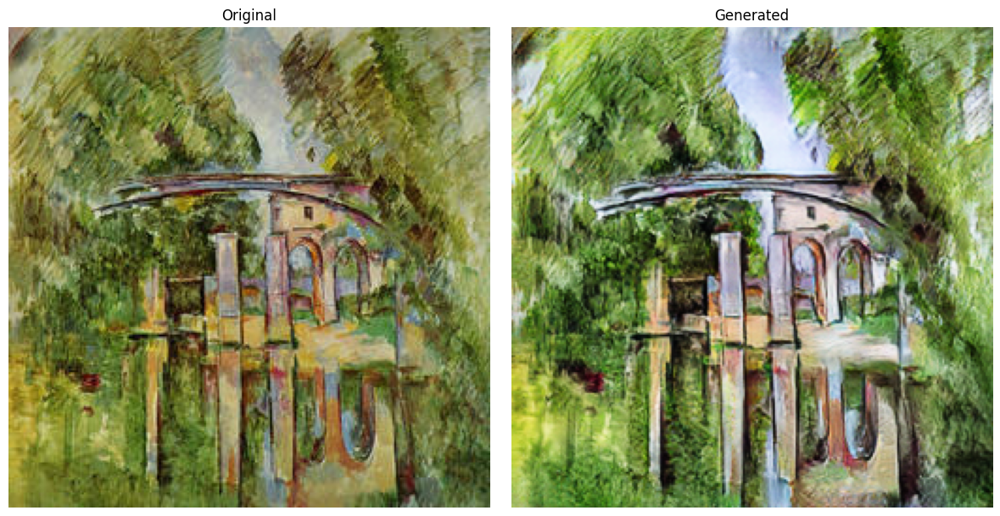

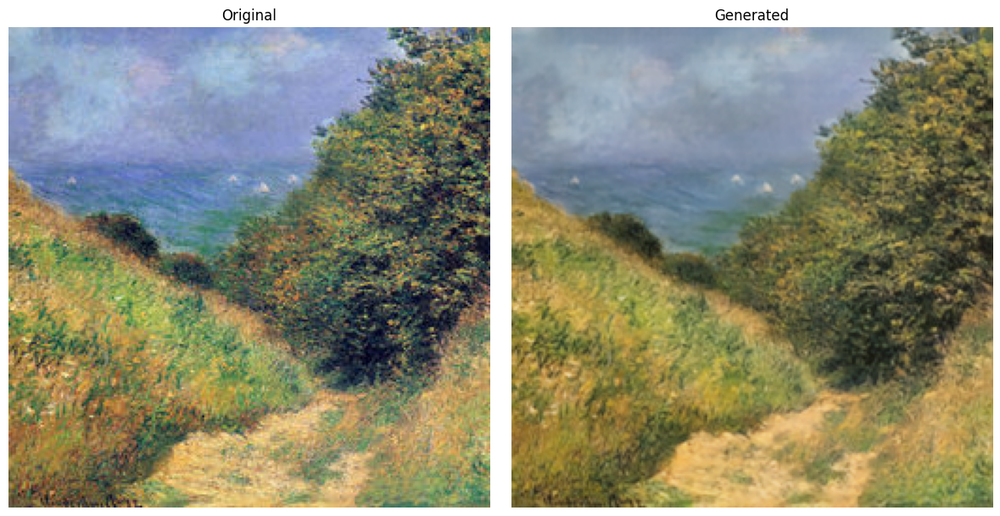

In [18]:
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_fake.png")
compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00460_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00460_fake.png")

#### Experiment: Color Spaces

In [12]:
import os
import numpy as np
from PIL import Image, ImageFilter
import matplotlib.pyplot as plt

# --- helper functions ---

def load_rgb(path):
    return Image.open(path).convert("RGB")

def img_to_np(img):
    arr = np.asarray(img).astype(np.float32) / 255.0  # [0,1]
    return arr

def np_to_img(arr):
    arr = np.clip(arr * 255.0, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

def simple_color_transfer_to_ref(src_img, ref_img):
    """
    Match per-channel mean and std in RGB space.
    This is a very simple (but often effective) color transfer.
    """
    src = img_to_np(src_img)   # H,W,3
    ref = img_to_np(ref_img)

    src_flat = src.reshape(-1, 3)
    ref_flat = ref.reshape(-1, 3)

    src_mean = src_flat.mean(axis=0)
    src_std  = src_flat.std(axis=0) + 1e-6
    ref_mean = ref_flat.mean(axis=0)
    ref_std  = ref_flat.std(axis=0) + 1e-6

    out = (src - src_mean) / src_std * ref_std + ref_mean
    return np_to_img(out)



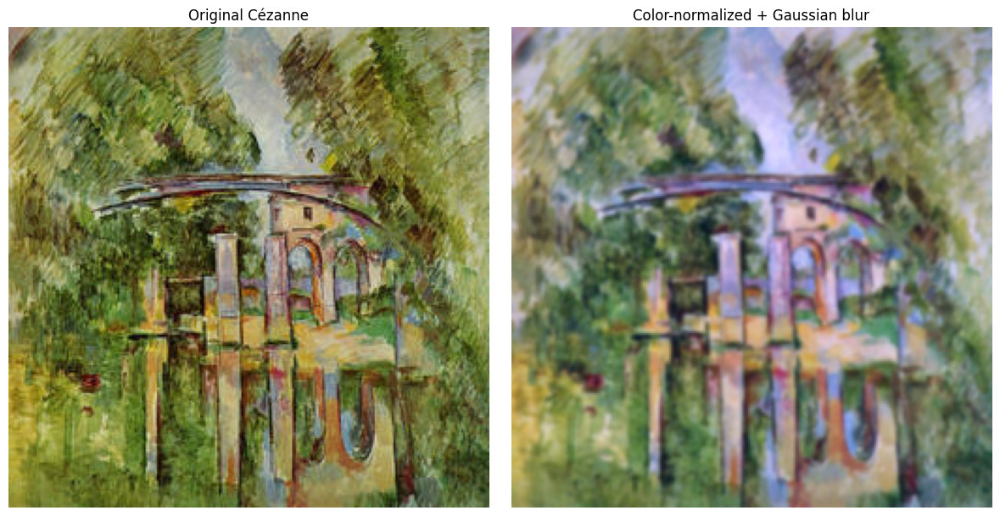

In [14]:
# Cézanne painting example
cez_path = "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_real.png"

# Monet painting for colot reference
monet_ref_path = "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_monet_latest/images/00460_real.png" 

cez_img = load_rgb(cez_path)
monet_ref_img = load_rgb(monet_ref_path)

# Color normalization towards Monet reference picture
cez_color_shifted = simple_color_transfer_to_ref(cez_img, monet_ref_img)

# Gaussian blur on top
cez_preproc = cez_color_shifted.filter(ImageFilter.GaussianBlur(radius=1))

# Show original vs preprocessed
plt.figure(figsize=(12, 6))
plt.subplot(1,2,1)
plt.imshow(cez_img)
plt.axis("off")
plt.title("Original Cézanne")

plt.subplot(1,2,2)
plt.imshow(cez_preproc)
plt.axis("off")
plt.title("Color-normalized + Gaussian blur")

plt.tight_layout()
plt.show()


In [16]:
out_dir = "pytorch-CycleGAN-and-pix2pix/datasets/cezanne2photo_preprocessed/testA"

os.makedirs(out_dir, exist_ok=True)

# reuse original filename so it's easy to recognize
out_path = os.path.join(out_dir, os.path.basename(cez_path))
cez_preproc.save(out_path)

print("Saved preprocessed image to:", out_path)


Saved preprocessed image to: pytorch-CycleGAN-and-pix2pix/datasets/cezanne2photo_preprocessed/testA/00500_real.png


Generated files: ['00500_real_fake.png', '00500_real_real.png']


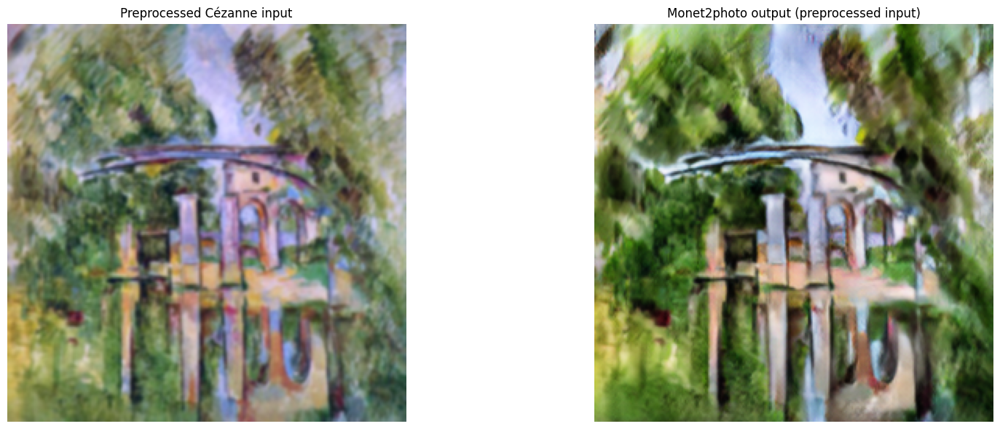

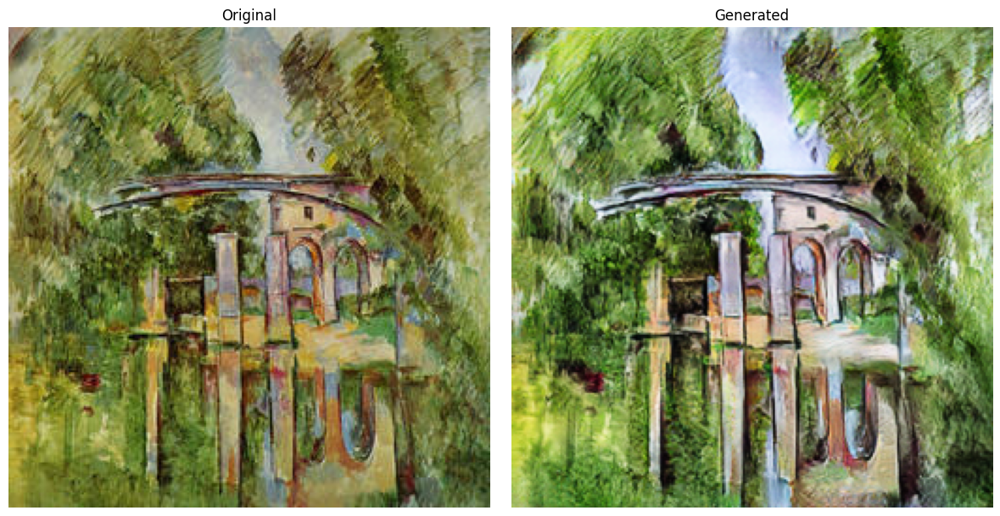

In [19]:
# Paths
cez_path = "pytorch-CycleGAN-and-pix2pix/datasets/cezanne2photo_preprocessed/testA/00500_real.png"  # or your filename
gen_dir  = "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/cezanne_preprocessed_single_latest/images"

# Find the generated image (usually something like 000001_fake_B.png)
gen_files = sorted(os.listdir(gen_dir))
print("Generated files:", gen_files)
gen_path = os.path.join(gen_dir, gen_files[0])

# Load images
orig_cez = Image.open(cez_path).convert("RGB")          # this is already preprocessed+saved
gen_img  = Image.open(gen_path).convert("RGB")

plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plt.imshow(orig_cez)
plt.axis("off")
plt.title("Preprocessed Cézanne input")

plt.subplot(1, 2, 2)
plt.imshow(gen_img)
plt.axis("off")
plt.title("Monet2photo output (preprocessed input)")

plt.tight_layout()
plt.show()

compare_single_pair("pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_real.png",
                    "pytorch-CycleGAN-and-pix2pix/results/monet2photo_pretrained/test_cezanne_latest/images/00500_fake.png")